In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import joblib

# Extrair os dados do BD MySQL

In [2]:
# SOON

# Ler os dados em formato bruto

In [3]:
data = 'ndt'
df = pd.read_csv(f'datasets/dados_{data}.csv')
df['DataHora'] = pd.to_datetime(df['DataHora'])

In [4]:
df = df[(df['ClientMac'] != 'dca6326b9aa1') & (df['ClientMac'] != 'dca6326b9ada') & (df['ClientMac'] != 'e45f018e527a')]
#df = df[df['DownloadSite'] == df['UploadSite']]
volunt_clients = ['e45f01963c21', 'e45f01359a20', 'dca6326b9ca8', 'dca6326b9c99']

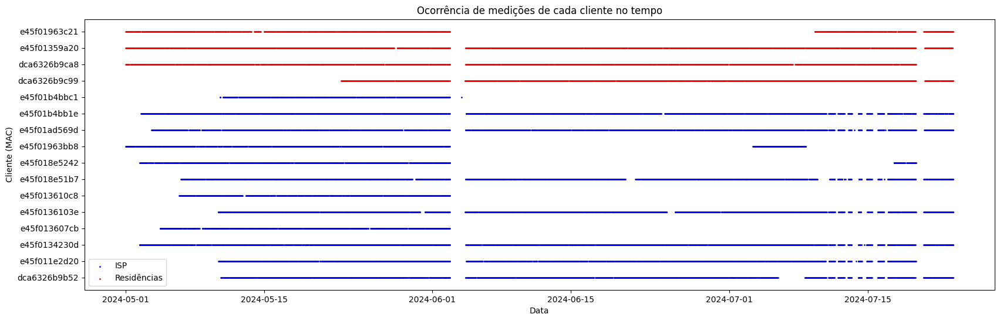

In [5]:
# Plotar a ocorrência de medições no tempo
df_grouped = df.groupby(['ClientMac', 'DataHora']).size().reset_index(name='count')

plt.figure(figsize=(20, 6))

# Plotar os clientes voluntários em uma cor diferente
volunt_clients = ['e45f01963c21', 'e45f01359a20', 'dca6326b9ca8', 'dca6326b9c99']
volunt_df = df_grouped[df_grouped['ClientMac'].isin(volunt_clients)]
non_volunt_df = df_grouped[~df_grouped['ClientMac'].isin(volunt_clients)]

plt.scatter(non_volunt_df['DataHora'], non_volunt_df['ClientMac'], s=1, label='ISP', color='blue')
plt.scatter(volunt_df['DataHora'], volunt_df['ClientMac'], s=1, label='Residências', color='red')

plt.xlabel('Data')
plt.ylabel('Cliente (MAC)')
plt.title('Ocorrência de medições de cada cliente no tempo')
plt.legend()
plt.show()

In [6]:
df.to_parquet(f'datasets/dados_{data}.parquet')

In [7]:
df.head()

,CodMedicao,SourceFile,DataHora,ClientMac,ClientIP,DownloadUUID,UploadUUID,Server,Download,Upload,...,DownloadSite,UploadSite,DownRTTMean,UpRTTMean,DownRTTMax,UpRTTMax,DownRTTMin,UpRTTMin,DownRTTStd,UpRTTStd
0,78202,e45f01963bb8_1714532959_mlab_ndt.json,2024-05-01 00:09:19,e45f01963bb8,2804:1e78:1234:1:cca3:3143:4172:15a8,ndt-mkk5c_1713509554_00000000001F0060,ndt-mkk5c_1713509554_00000000001EE0B3,ndt-mlab3-gru03.mlab-oti.measurement-lab.org,181.595,177.952,...,gru03,gru03,122.207,123.713,126.583,124.846,121.685,122.180,0.785,0.690
1,78203,e45f01963c21_1714533086_sp_ndt.json,2024-05-01 00:11:26,e45f01963c21,179.34.141.46,sp.medidor.rnp.br_1658354506_0000000000080812,sp.medidor.rnp.br_1658354506_0000000000080813,sp.medidor.rnp.br,521.762,258.826,...,rnp_sp,rnp_sp,10.805,18.916,13.793,22.515,10.205,16.785,0.584,1.967
2,78205,dca6326b9ca8_1714533545_rj_ndt.json,2024-05-01 00:19:05,dca6326b9ca8,189.60.105.143,rj.medidor.rnp.br_1690502765_0000000000053BCE,rj.medidor.rnp.br_1690502765_0000000000053BD0,rj.medidor.rnp.br,580.116,145.417,...,rnp_rj,rnp_rj,17.555,36.876,25.310,47.138,12.505,12.471,3.513,7.467
3,78204,e45f01359a20_1714533553_rj_ndt.json,2024-05-01 00:19:13,e45f01359a20,179.164.66.185,rj.medidor.rnp.br_1690502765_0000000000053BCF,rj.medidor.rnp.br_1690502765_0000000000053BD1,rj.medidor.rnp.br,593.942,299.881,...,rnp_rj,rnp_rj,16.774,18.259,24.785,22.131,14.408,16.128,2.250,1.389
4,78206,e45f01963bb8_1714534509_mlab_ndt.json,2024-05-01 00:35:09,e45f01963bb8,2804:1e78:1234:1:cca3:3143:4172:15a8,ndt-v2zzh_1713554864_00000000001B6CF6,ndt-v2zzh_1713554864_00000000001C6D0E,ndt-mlab1-gru03.mlab-oti.measurement-lab.org,177.354,177.260,...,gru03,gru03,122.646,126.999,127.056,131.593,121.897,122.491,1.092,2.278


# Exportar as séries temporais dos dados

In [8]:
from timeseries_processing import export_time_series

# Exporta as séries temporais
df_ts = export_time_series(data)

In [9]:
df_ts.head()

,client,site,inicio,fim,num_med,mean_time,file_prefix
0,e45f01963bb8,gru03,2024-05-01 00:09:19,2024-07-08 13:04:12,163,10.2,e45f01963bb8_gru03
1,e45f01963bb8,rnp_sp,2024-05-01 01:06:22,2024-07-08 16:52:33,333,5.0,e45f01963bb8_rnp_sp
2,e45f01963bb8,rnp_rj,2024-05-01 02:27:26,2024-07-08 16:13:03,704,2.3,e45f01963bb8_rnp_rj
3,e45f01963bb8,gru05,2024-05-03 10:31:24,2024-07-08 17:16:35,106,15.2,e45f01963bb8_gru05
4,e45f01963bb8,gru06,2024-05-02 22:27:15,2024-07-07 13:22:04,102,15.6,e45f01963bb8_gru06


In [10]:
df_ts['client'].unique()

array(['e45f01963bb8', 'e45f01963c21', 'dca6326b9ca8', 'e45f01359a20',
       'e45f018e5242', 'e45f0134230d', 'e45f01b4bb1e', 'e45f01ad569d',
       'e45f013607cb', 'e45f013610c8', 'e45f018e51b7', 'e45f0136103e',
       'e45f011e2d20', 'e45f01b4bbc1', 'dca6326b9b52', 'dca6326b9c99'],
      dtype=object)

In [11]:
df_ts['site'].unique()

array(['gru03', 'rnp_sp', 'rnp_rj', 'gru05', 'gru06'], dtype=object)

# Rodar o VWCD para detecção de pontos de mudança

In [17]:
from timeseries_processing import detect_changepoints

# Configuração dos hiperparâmetros do VWCD
wv = 20                  # Tamanho da janela deslizante
ab = 1                   # Hiperparâmetros Alfa e Beta da beta-binomial - distribuição a priori da janela
p_thr = 0.8              # Limiar de probabilidade para o voto de uma janela ser registrado
vote_p_thr = 0.9         # Limiar de probabilidade para definir um ponto de mudança após a agregação dos votos
vote_n_thr = 0.5         # Fração mínima da janela que precisa votar para definir um ponto de mudança após a agregação
y0 = 0.5                 # Probabilidade a priori da função logística (início da janela)
yw = 0.9                 # Probabilidade a priori da função logística (início da janela)
aggreg = 'mean'          # Função de agregação dos votos

# Detectar pontos de mudança nas séries temporais
detect_changepoints(data, wv, ab, p_thr, vote_p_thr, vote_n_thr, y0, yw, aggreg)

Changepoints detectados e salvos em: datasets/ts_ndt_cp/


In [19]:
import os

# Processar cada arquivo Parquet de séries temporais
input_dir = 'datasets/ts_ndt/'
for file in os.listdir(input_dir):
    if file.endswith(".parquet"):
        # Carregar a série temporal
        df = pd.read_parquet(os.path.join(input_dir, file))
        if df.isna().sum().sum() > 0:
            print(f'Arquivo {file} contém valores nulos')
            continue

Arquivo e45f011e2d20_rnp_rj.parquet contém valores nulos


In [31]:
from timeseries_processing import detect_changepoints_np

# Configuração dos hiperparâmetros do VWCD
wv = 20                  # Tamanho da janela deslizante
vote_n_thr = 0.5         # Fração mínima da janela que precisa votar para definir um ponto de mudança após a agregação
vote_js_thr = 0.5

# Detectar pontos de mudança nas séries temporais
detect_changepoints_np(data, wv, vote_js_thr, vote_n_thr)

Changepoints detectados e salvos em: datasets/ts_ndt_cp/


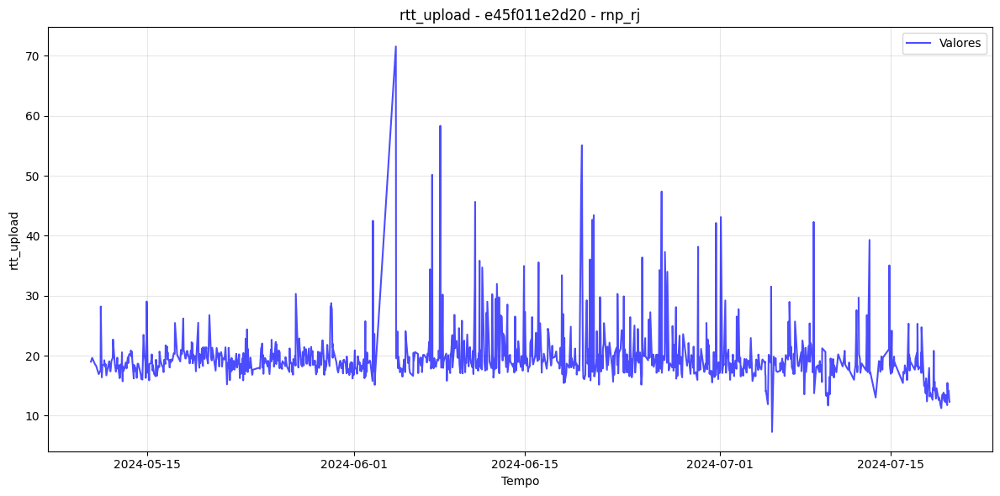

In [20]:
from timeseries_processing import plot_changepoints

# Plotar a série com os pontos de mudança
client = 'e45f011e2d20'
site = 'rnp_rj'
feature = 'rtt_upload'
plot_changepoints(data, client, site, feature)

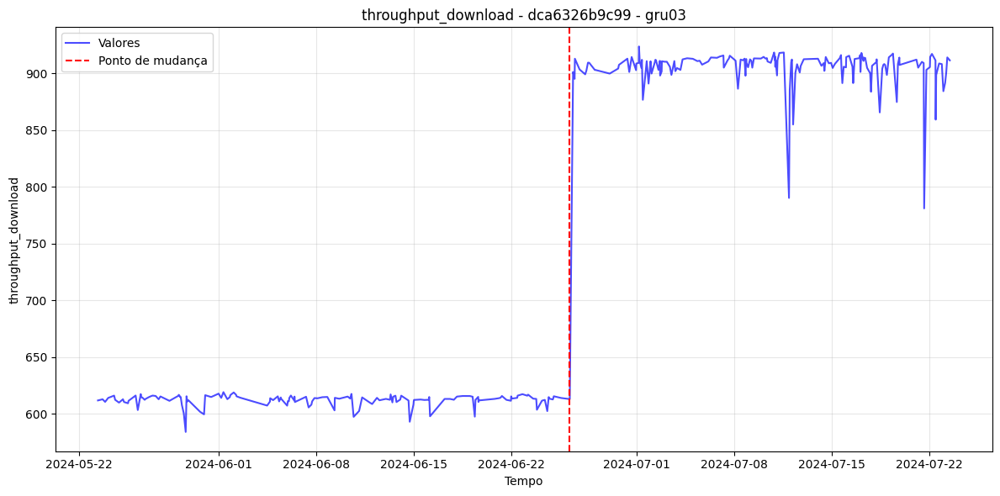

In [21]:
# Plotar série com os pontos de mudança
client = 'dca6326b9c99'
site = 'gru03'
feature = 'throughput_download'
plot_changepoints(data, client, site, feature)

# Criar um conjunto de dados de sobrevivência

In [12]:
from timeseries_processing import create_survival_dataset

df_surv = create_survival_dataset(data, 'throughput_download', max_gap_days=3)

In [13]:
df_surv.head()

,timestamp_start,timestamp_end,time,throughput_download,rtt_download,throughput_upload,rtt_upload,event,client_dca6326b9b52,client_dca6326b9c99,...,client_e45f01963bb8,client_e45f01963c21,client_e45f01ad569d,client_e45f01b4bb1e,client_e45f01b4bbc1,site_gru03,site_gru05,site_gru06,site_rnp_rj,site_rnp_sp
0,2024-05-10 15:36:11,2024-06-28 18:26:25,49.118218,154.7830,124.039,176.5400,124.172,0,1,0,...,0,0,0,0,0,1,0,0,0,0
1,2024-06-28 18:26:25,2024-07-01 12:13:05,2.740741,170.5440,115.040,188.8880,116.433,1,1,0,...,0,0,0,0,0,1,0,0,0,0
2,2024-07-01 12:13:05,2024-07-05 11:54:36,3.987164,88.9042,220.551,93.5441,225.600,0,1,0,...,0,0,0,0,0,1,0,0,0,0
3,2024-07-05 11:54:36,2024-07-09 01:11:25,3.553345,188.0300,118.344,184.7620,117.621,0,1,0,...,0,0,0,0,0,1,0,0,0,0
4,2024-07-09 01:11:25,2024-07-09 21:31:20,0.847164,173.2890,124.450,188.3010,119.367,0,1,0,...,0,0,0,0,0,1,0,0,0,0


# Separar dados de entrada e de saída do modelo

In [14]:
# Criar lista com os nomes das colunas dummies iniciadas por 'client_' e 'site_'
client_cols = [col for col in df_surv.columns if col.startswith('client_')]
site_cols = [col for col in df_surv.columns if col.startswith('site_')]
onehot_cols = client_cols + site_cols

features = onehot_cols + ['throughput_download', 'throughput_upload', 'rtt_download', 'rtt_upload']
X = df_surv[features]
y = df_surv[['time', 'event']]

# Pré-processamento dos dados de sobrevivência

In [15]:
from sklearn.preprocessing import StandardScaler

# Ajustar scaler aos dados de treinamento e aplicar aos conjuntos de treinamento, validação e teste
features_to_scale = ['throughput_download', 'throughput_upload', 'rtt_download', 'rtt_upload']

scaler = StandardScaler()
X_scaled = X.copy()
X_scaled[features_to_scale] = scaler.fit_transform(X[features_to_scale])

In [16]:
from SurvMixClust_utils import y_array

db_ = df_surv.copy()

time_column = 'time'
event_column = 'event'

X = X_scaled[features].copy()
T = y[time_column].copy()
E = y[event_column].copy()
y = y_array(E, T)

# Treinar modelo SurvMixClust

In [27]:
from SurvMixClust import SurvMixClust

# Configuração dos hiperparâmetros do SurvMixClust
n_clusters = [2, 3]        # Números de clusters a serem testados
n_fits = 20                # Número de ajustes do algoritmo EM
max_EM_interations = 100    # Número máximo de iterações do algoritmo EM para convergência
n_jobs = -1                # Número de processadores a serem utilizados

model = SurvMixClust(n_clusters, n_fits, max_EM_interations, n_jobs)
model.fit(X, y)


######## Selecting bandwidth ########

#### plug-in estimate with 100% of data ####
#### success ####

Parallel processing for 2 number of clusters, n_jobs: -1.
######## iteration: 0
######## iteration: 0
######## iteration: 0
######## iteration: 0
######## iteration: 0
######## iteration: 0
######## iteration: 0
######## iteration: 0
	# cindex (with labels) with train_set at iteration 0: 0.5592920353982301
	# cindex (with labels) with train_set at iteration 0: 0.5493046776232617
	# cindex (with labels) with train_set at iteration 0: 0.5542351453855878
	# cindex (with labels) with train_set at iteration 0: 0.7410240202275601
	# cindex (with labels) with train_set at iteration 0: 0.5811630847029077
	# cindex (with labels) with val_set at iteration 0: 0.5959409594095941
	# cindex (with labels) with train_set at iteration 0: 0.5515170670037927
	# cindex (with labels) with train_set at iteration 0: 0.5532869785082174
	# cindex (with labels) with train_set at iteration 0: 0.691213653603034

SurvMixClust(max_EM_interations=100, n_clusters=[2, 3], n_fits=20, n_jobs=-1)

In [ ]:
# Salvar o modelo em arquivo
joblib.dump(model, 'survmixclust.pkl')

# Carregar modelo salvo

In [17]:
# Carregar o modelo de arquivo
model = joblib.load('survmixclust.pkl')

# Informações do modelo

In [18]:
model.score(X, y, metric='cindex')

0.7670393076090877

In [19]:
model.training_set_labels()

array([1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1,
       1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0])

In [20]:
# labels = model.predict(X_test)

In [22]:
fig = model.plot_clusters()
# fig = model.plot_clusters(n_cluster=3, n_fit=0)

fig.show()

In [23]:
from SurvMixClust_utils import info_flat_from_info_list_K, best_model_keys_from_info_list_K

info_flat = info_flat_from_info_list_K(model.info_list_K)

In [24]:
best_model_keys = best_model_keys_from_info_list_K(model.info_list_K)
num_clusters_best = best_model_keys[0]

# Criar dataframe com os pesos de cada feature

In [25]:
# DataFrame associando as features aos seus coeficientes da regressão logística
logistic_coefficients = model.info['logit'].coef_

coefficients_df = pd.DataFrame({
    'feature': features,
    'coefficient': logistic_coefficients[0]
})

In [26]:
coefficients_df

,feature,coefficient
0,client_dca6326b9b52,0.366533
1,client_dca6326b9c99,-0.274688
2,client_dca6326b9ca8,0.439354
3,client_e45f011e2d20,0.270905
4,client_e45f0134230d,-1.455287
5,client_e45f01359a20,-1.710525
6,client_e45f013607cb,0.266259
7,client_e45f0136103e,-0.785127
8,client_e45f013610c8,-0.261917
9,client_e45f018e51b7,0.009637


# Calcular a probabilidade de cada par pertencer a cada cluster

In [27]:
# Separar as colunas de cliente e site
client_columns = [col for col in df_surv.columns if col.startswith('client_')]
site_columns = [col for col in df_surv.columns if col.startswith('site_')]

# Identificar os pares cliente-site únicos
pairs = df_surv[client_columns + site_columns]

# Adicionar as métricas de interesse ao novo dataset
metrics = ['throughput_download', 'throughput_upload', 'rtt_download', 'rtt_upload']

# Agrupar os dados pelo par cliente-site e calcular a média das métricas
aggregated_data = df_surv.groupby(client_columns + site_columns)[metrics].mean().reset_index()

In [28]:
# Aplicar o scaler aos dados agregados
aggregated_data_scaled = aggregated_data.copy()
aggregated_data_scaled[metrics] = scaler.transform(aggregated_data[metrics])

In [29]:
# Certifique-se de que as colunas são consistentes e remova os nomes para compatibilidade
X_new = aggregated_data_scaled.values  # Converta para numpy array

# Prever as probabilidades usando o atributo logit
probabilities = model.logit.predict_proba(X_new)

# Cada linha em `probabilities` indica as probabilidades de pertencimento a cada cluster


In [30]:
# Adicionar as probabilidades ao dataframe agregado

aggregated_data['prob_cluster_0'] = probabilities[:, 0]
aggregated_data['prob_cluster_1'] = probabilities[:, 1]

# Criar o dataframe final com as colunas 'client', 'site', 'prob_cluster_0', 'prob_cluster_1'
final_df = aggregated_data[client_columns + site_columns + ['prob_cluster_0', 'prob_cluster_1']]

In [31]:
from process_results import decode_one_hot

# Decodificar os clientes
final_df = decode_one_hot(final_df, "client_")

# Decodificar os sites
final_df = decode_one_hot(final_df, "site_")

# Selecionar as colunas relevantes
df_final = final_df[['client', 'site', 'prob_cluster_0', 'prob_cluster_1']]

In [32]:
df_final

,client,site,prob_cluster_0,prob_cluster_1
0,e45f01b4bbc1,rnp_sp,0.190702,0.809298
1,e45f01b4bbc1,rnp_rj,0.382119,0.617881
2,e45f01b4bb1e,rnp_sp,0.123704,0.876296
3,e45f01b4bb1e,rnp_rj,0.272292,0.727708
4,e45f01b4bb1e,gru06,0.024856,0.975144
...,...,...,...,...
65,dca6326b9b52,rnp_sp,0.112890,0.887110
66,dca6326b9b52,rnp_rj,0.414368,0.585632
67,dca6326b9b52,gru06,0.024413,0.975587
68,dca6326b9b52,gru05,0.024597,0.975403


# Rotular séries temporais e dataset de sobrevivência

In [33]:
# Criar coluna com o cluster para cada intervalo no dataset de sobrevivência
df_surv_bkp = df_surv.copy()
df_surv['cluster'] = -1
df_surv.loc[:, 'cluster'] = model.predict(X)

In [34]:
# Criar colunas com a probabilidade de pertencimento a cada cluster
df_surv[[f'probability_cluster_{i}' for i in range(num_clusters_best)]] = -1

# Calcular as probabilidades de cada cluster e criar um DataFrame com as probabilidades
probs = model.logit.predict_proba(X)
df_probs = pd.DataFrame(probs, columns=[f'probability_cluster_{i}' for i in range(num_clusters_best)])

# Adicionar as probabilidades ao dataset de sobrevivência
df_surv.loc[:, df_probs.columns] = df_probs.values

/home/ian/anaconda3/envs/env_for_SurvMixClust/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



In [35]:
# Obter as funções de sobrevivência para cada intervalo
surv_fcns = model.predict_surv_df(X)

In [36]:
from process_results import get_hazard

# Calcular a função de risco para cada intervalo
hazard_fcns = get_hazard(surv_fcns)

In [37]:
from process_results import assign_labels

assign_labels(df_surv, data, 'timestamp', surv_fcns, hazard_fcns)

Clusters associados e séries temporais salvas em: datasets/ts_ndt_results/


# Análise visual de cada cluster

In [38]:
df_cluster_1 = df_surv[(df_surv['cluster'] == 1)]
df_cluster_0 = df_surv[(df_surv['cluster'] == 0)]

# Decodificar colunas de client e site
df_cluster_1 = decode_one_hot(df_cluster_1, 'client_')
df_cluster_1 = decode_one_hot(df_cluster_1, 'site_')
df_cluster_0 = decode_one_hot(df_cluster_0, 'client_')
df_cluster_0 = decode_one_hot(df_cluster_0, 'site_')

# Verificar quantos pares cliente-site únicos existem no cluster 1 e sua frequência
df_cluster_1_pairs = df_cluster_1.groupby(['client', 'site']).size().sort_values(ascending=False)
df_cluster_0_pairs = df_cluster_0.groupby(['client', 'site']).size().sort_values(ascending=False)

# Verificar quais pares cliente-site aparecem em ambos os clusters
pairs_both_clusters = df_cluster_1_pairs.index.intersection(df_cluster_0_pairs.index).to_list()
pairs_cluster_0 = df_cluster_0_pairs.index.to_list()
pairs_cluster_1 = df_cluster_1_pairs.index.to_list()

# Excluindo pares que aparecem em ambos os clusters
pairs_cluster_0 = [pair for pair in pairs_cluster_0 if pair not in pairs_both_clusters]
pairs_cluster_1 = [pair for pair in pairs_cluster_1 if pair not in pairs_both_clusters]

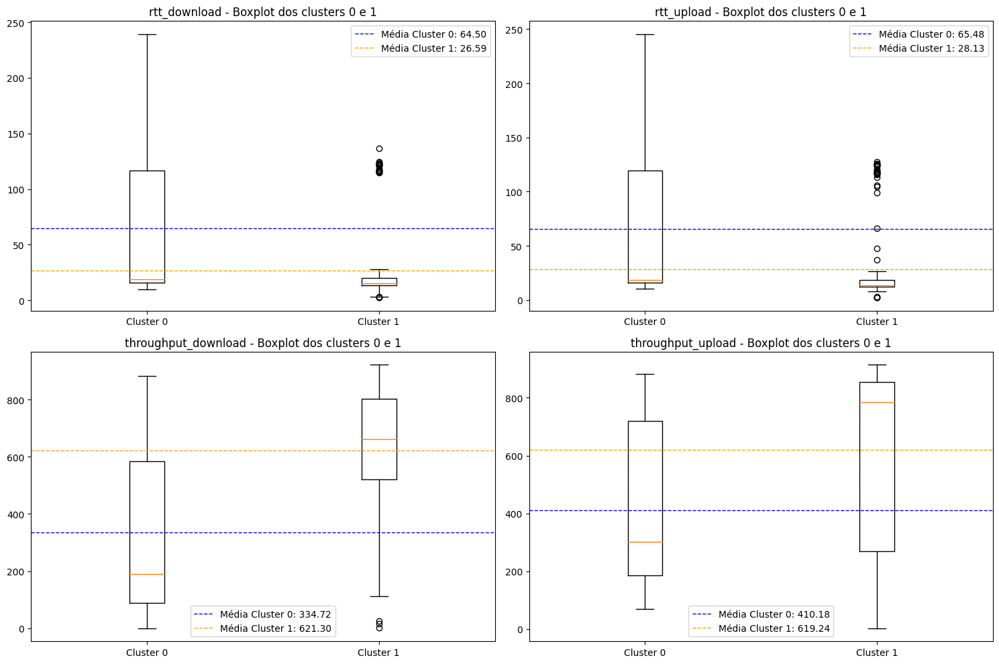

In [46]:
# Plotar boxplots de cada métrica para os clusters 0 e 1
plt.figure(figsize=(15, 10))

for i, feature in enumerate(['rtt_download', 'rtt_upload', 'throughput_download', 'throughput_upload']):
    plt.subplot(2, 2, i+1)
    plt.boxplot([df_cluster_0[feature], df_cluster_1[feature]])
    plt.xticks([1, 2], ['Cluster 0', 'Cluster 1'])
    plt.title(f'{feature} - Boxplot dos clusters 0 e 1')
    
    # Adicionar linha de média para cada cluster
    mean_cluster_0 = df_cluster_0[feature].mean()
    mean_cluster_1 = df_cluster_1[feature].mean()
    plt.axhline(mean_cluster_0, color='blue', linestyle='--', linewidth=1, label=f'Média Cluster 0: {mean_cluster_0:.2f}')
    plt.axhline(mean_cluster_1, color='orange', linestyle='--', linewidth=1, label=f'Média Cluster 1: {mean_cluster_1:.2f}')
    plt.legend()

plt.tight_layout()
plt.show()

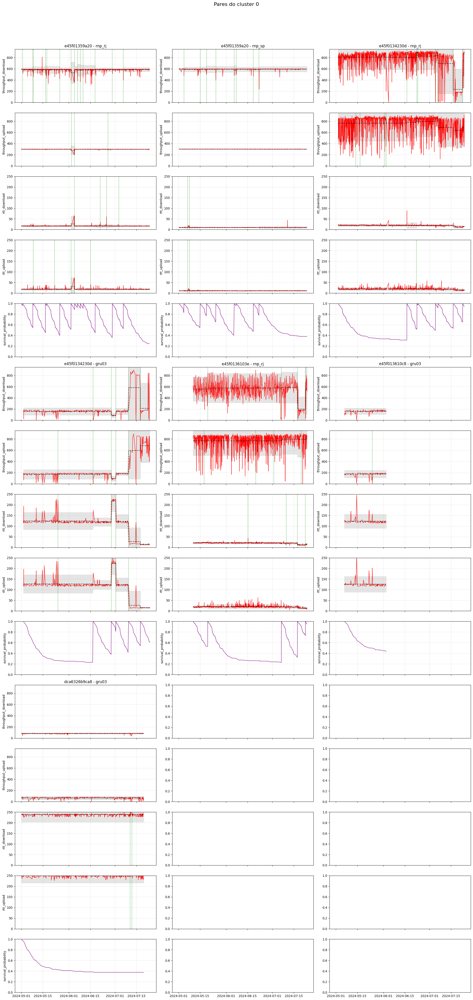

In [73]:
from visual_analysis import plot_all_pairs

# Plotar todos os pares com intervalos apenas no cluster 0 ("ruim")
plot_all_pairs(data, pairs_cluster_0, title="Pares do cluster 0", survival=True, local_mean=True, changepoints=True)

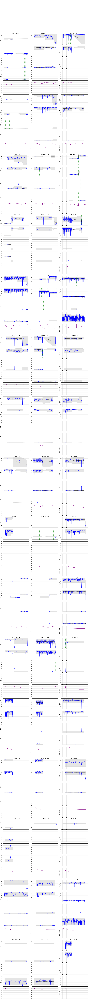

In [ ]:
# Plotar todos os pares com intervalos apenas no cluster 1 ("bom")
plot_all_pairs(data, pairs_cluster_1, title="Pares do cluster 1", survival=True, local_mean=True, changepoints=True)

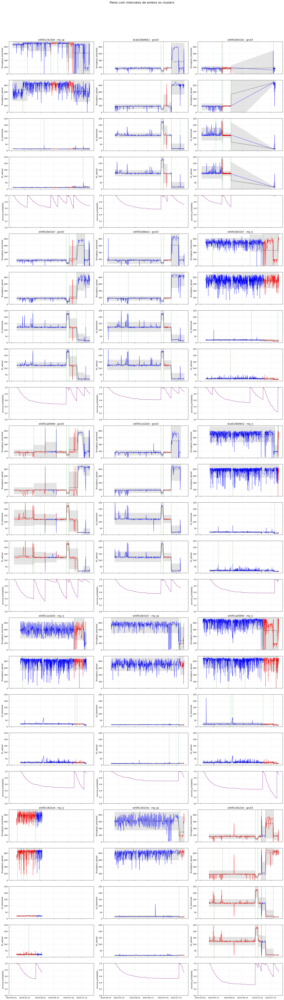

In [75]:
# Plotar pares com intervalos em ambos os clusters
plot_all_pairs(data, pairs_both_clusters, title="Pares com intervalos de ambos os clusters", survival=True, local_mean=True, changepoints=True)

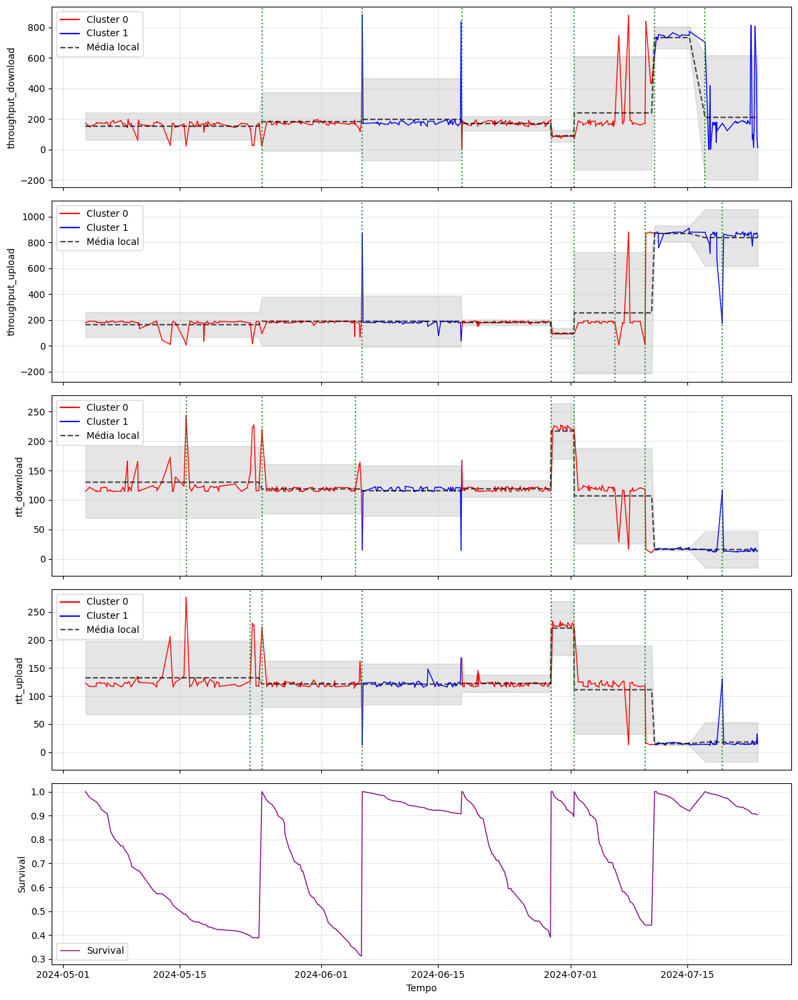

In [83]:
from visual_analysis import plot_one_pair

# Plotar os pontos de mudança
client = 'e45f01ad569d'
site = 'gru03'
variable = 'throughput_download'
plot_one_pair(data, client, site, survival=True, local_mean=True, changepoints=True, ylim=None)

In [84]:
df_cluster_1 = df_surv[(df_surv['cluster'] == 1)]

# Decodificar colunas de client e site
df_cluster_1 = decode_one_hot(df_cluster_1, 'client_')
df_cluster_1 = decode_one_hot(df_cluster_1, 'site_')

# Verificar quantos pares cliente-site únicos existem no cluster 1 e sua frequência
df_cluster_1.groupby(['client', 'site']).size().sort_values(ascending=False)

client        site  
e45f01963c21  rnp_rj    7
e45f01b4bb1e  gru06     6
e45f018e5242  rnp_sp    6
e45f01963c21  rnp_sp    5
e45f01ad569d  rnp_sp    5
                       ..
e45f011e2d20  gru05     1
dca6326b9ca8  rnp_sp    1
              gru06     1
              gru05     1
e45f01b4bbc1  rnp_sp    1
Length: 63, dtype: int64

In [85]:
df_cluster_0 = df_surv[(df_surv['cluster'] == 0)]

# Decodificar colunas de client e site
df_cluster_0 = decode_one_hot(df_cluster_0, 'client_')
df_cluster_0 = decode_one_hot(df_cluster_0, 'site_')

# Verificar quantos pares cliente-site únicos existem no cluster 1 e sua frequência
df_cluster_0.groupby(['client', 'site']).size().sort_values(ascending=False)

client        site  
e45f01359a20  rnp_rj    15
              rnp_sp     9
e45f0134230d  rnp_rj     8
              gru03      6
e45f0136103e  gru03      6
              rnp_rj     5
e45f01ad569d  gru03      5
              rnp_rj     2
e45f018e5242  gru03      2
e45f0134230d  rnp_sp     2
e45f0136103e  rnp_sp     2
e45f018e51b7  rnp_rj     2
e45f013610c8  rnp_rj     2
e45f018e51b7  gru03      1
              rnp_sp     1
dca6326b9b52  gru03      1
e45f013610c8  gru03      1
dca6326b9b52  rnp_rj     1
e45f011e2d20  rnp_rj     1
              gru03      1
dca6326b9ca8  gru03      1
e45f01b4bb1e  gru03      1
dtype: int64